In [1]:
import csv
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import matplotlib.dates as mdates

from scipy.stats import pearsonr
from scipy import stats
from scipy.stats import wilcoxon
from scipy.stats import ttest_rel
from scipy.stats import shapiro
from scipy.stats import ttest_ind

from datetime import datetime, timedelta

In [2]:
import sys
print(sys.version)

3.11.5 | packaged by Anaconda, Inc. | (main, Sep 11 2023, 13:26:23) [MSC v.1916 64 bit (AMD64)]


In [3]:
HR_Data = [
    "HR_Data/2024-04-15_10-38-38-712302_HR.csv",
    "HR_Data/2024-04-15_11-28-00-175125_HR.csv",
    "HR_Data/2024-04-15_12-33-33-691264_HR.csv",
    "HR_Data/2024-04-15_13-52-33-642731_HR.csv",
    "HR_Data/2024-04-16_10-02-14-766070_HR.csv",
    "HR_Data/2024-04-16_11-22-14-029313_HR.csv",
    "HR_Data/2024-04-16_12-39-00-091705_HR.csv",
    "HR_Data/2024-04-16_13-49-21-913269_HR.csv",
    "HR_Data/2024-04-16_14-21-51-772231_HR.csv",
    "HR_Data/2024-04-16_15-31-28-717384_HR.csv",
    "HR_Data/2024-04-16_16-54-51-545033_HR.csv",
    "HR_Data/2024-04-17_09-34-58-833285_HR.csv",
    "HR_Data/2024-04-17_10-45-54-188717_HR.csv",
    "HR_Data/2024-04-17_11-28-49-297919_HR.csv",
    "HR_Data/2024-04-17_12-47-38-213138_HR.csv",
    "HR_Data/2024-04-19_09-39-10-052213_HR.csv",
    "HR_Data/2024-04-19_10-31-51-574693_HR.csv",
    "HR_Data/2024-04-19_11-37-40-596462_HR.csv",
    "HR_Data/2024-04-19_12-36-12-809287_HR.csv",
    "HR_Data/2024-04-19_13-26-13-472477_HR.csv",
    "HR_Data/2024-04-19_13-59-27-515052_HR.csv",
]


In [4]:
therapy_regions = {
    'ID001': [
        ('00:05.00', '06:34.04', 'red'),
        ('11:17.48', '16:25.11', 'blue'),
        ('21:33.80', '26:35.72', 'red'),
        ('28:01.37', '33:00.10', 'blue')
    ],
    'ID002': [
        ('00:09.00', '05:18.99', 'red'),
        ('06:27.37', '11:27.72', 'blue'),
        ('15:32.30', '20:25.70', 'red'),
        ('22:56.52', '28:04.70', 'blue')
    ],
    'ID003': [
        ('00:05.00', '05:34.83', 'red'),
        ('08:19.86', '13:24.79', 'blue'),
        ('19:04.51', '24:11.14', 'red'),
        ('25:32.41', '30:32.94', 'blue')
    ],
    'ID004': [
        ('00:10.00', '06:10.47', 'red'),
        ('07:06.67', '11:59.38', 'blue'),
        ('15:37.42', '20:37.52', 'red'),
        ('22:27.47', '27:26.20', 'blue')
    ],
    'ID009': [
        ('00:07.00', '04:18.97', 'red'),
        ('06:59.71', '11:20.77', 'blue'),
        ('13:28.26', '18:04.71', 'red'),
        ('19:01.95', '24:02.28', 'blue')
    ],
    'ID010': [
        ('00:04.00', '04:44.18', 'red'),
        ('05:36.99', '10:25.13', 'blue'),
        ('11:13.80', '16:21.72', 'red'),
        ('16:57.97', '22:38.73', 'blue')
    ],
    'ID011': [
        ('00:03.80', '05:55.57', 'red'),
        ('08:34.06', '13:35.38', 'blue'),
        ('19:34.94', '25:09.65', 'red'),
        ('26:11.03', '30:12.25', 'blue')
    ],
    'ID012': [
        ('00:04.00', '05:03.04', 'red'),
        ('06:13.52', '11:15.94', 'blue'),
        ('14:59.69', '18:40.95', 'red'),
        ('22:04.80', '26:18.40', 'blue')
    ],
    'ID013': [
        ('00:03.40', '06:59.60', 'red'),
        ('08:58.18', '14:00.96', 'blue'),
        ('16:56.72', '22:08.24', 'red'),
        ('23:05.12', '28:06.28', 'blue')
    ],
    'ID014': [
        ('00:05.00', '05:09.68', 'red'),
        ('10:32.97', '15:48.73', 'blue'),
        ('18:56.25', '25:06.24', 'red'),
        ('25:08.87', '30:12.76', 'blue')
    ],
    'ID015': [
        ('00:20.00', '05:59.70', 'red'),
        ('06:19.95', '11:52.87', 'blue'),
        ('15:18.23', '20:53.80', 'red'),
        ('25:19.02', '31:13.11', 'blue')
    ],
    'ID007': [
        ('00:05.00', '05:45.56', 'red'),
        ('08:47.33', '13:57.63', 'blue'),
        ('18:56.52', '24:11.50', 'red'),
        ('25:06.50', '30:08.15', 'blue')
    ],
    'ID018': [
        ('00:05.00', '05:08.87', 'red'),
        ('06:15.81', '11:16.24', 'blue'),
        ('13:07.28', '18:23.93', 'red'),
        ('20:11.25', '25:15.96', 'blue')
    ],
    'ID019': [
        ('00:04.00', '05:31.12', 'red'),
        ('07:36.00', '12:59.86', 'blue'),
        ('17:24.60', '22:28.62', 'red'),
        ('22:56.75', '28:08.37', 'blue')
    ],
    'ID020': [
        ('00:03.00', '05:52.81', 'red'),
        ('06:13.73', '11:14.32', 'blue'),
        ('14:11.42', '19:33.86', 'red'),
        ('21:48.63', '26:56.09', 'blue')
    ],
    'ID025': [
        ('00:03.40', '05:16.93', 'red'),
        ('07:36.02', '12:40.41', 'blue'),
        ('17:45.77', '22:38.63', 'red'),
        ('23:41.95', '29:24.75', 'blue')
    ],
    'ID026': [
        ('00:05.00',  '05:18.69', 'red'),
        ('05:48.91', '10:50.33', 'blue'),
        ('13:00.47', '18:34.78', 'red'),
        ('23:10.52', '28:16.09', 'blue')
    ],
    'ID027': [
        ('00:15.90', '05:48.18', 'red'),
        ('08:26.81', '13:29.52', 'blue'),
        ('17:10.89', '22:39.95', 'red'),
        ('23:06.39', '28:10.36', 'blue')
    ],
    'ID028': [
        ('00:04.40', '04:44.64', 'red'),
        ('05:00.67', '10:02.01', 'blue'),
        ('11:33.20', '16:26.40', 'red'),
        ('18:14.99', '23:16.71', 'blue')
    ],
    'ID029': [
        ('00:03.20', '04:55.91', 'red'),
        ('07:33.23', '12:39.31', 'blue'),
        ('16:05.65', '21:26.50', 'red'),
        ('22:05.81', '27:07.25', 'blue')
    ],
    'ID030': [
        ('00:10.00', '05:11.87', 'red'),
        ('06:10.36', '11:13.16', 'blue'),
        ('14:16.56', '19:33.07', 'red'),
        ('21:18.19', '26:21.95', 'blue')
    ]
}


In [5]:
participant_dfs = []

In [6]:
# Reading HR_data
for file_path in HR_Data:
    print(file_path)
    df = pd.read_csv(file_path)
    df['LocalTimestamp'] = pd.to_datetime(df['LocalTimestamp'], unit='s').dt.tz_localize('UTC').dt.tz_convert('Europe/Amsterdam')

    participant_dfs.append(df)

# can add [x] with x being a value from 0 to 20
#participant_dfs[x]


HR_Data/2024-04-15_10-38-38-712302_HR.csv
HR_Data/2024-04-15_11-28-00-175125_HR.csv
HR_Data/2024-04-15_12-33-33-691264_HR.csv
HR_Data/2024-04-15_13-52-33-642731_HR.csv
HR_Data/2024-04-16_10-02-14-766070_HR.csv
HR_Data/2024-04-16_11-22-14-029313_HR.csv
HR_Data/2024-04-16_12-39-00-091705_HR.csv
HR_Data/2024-04-16_13-49-21-913269_HR.csv
HR_Data/2024-04-16_14-21-51-772231_HR.csv
HR_Data/2024-04-16_15-31-28-717384_HR.csv
HR_Data/2024-04-16_16-54-51-545033_HR.csv
HR_Data/2024-04-17_09-34-58-833285_HR.csv
HR_Data/2024-04-17_10-45-54-188717_HR.csv
HR_Data/2024-04-17_11-28-49-297919_HR.csv
HR_Data/2024-04-17_12-47-38-213138_HR.csv
HR_Data/2024-04-19_09-39-10-052213_HR.csv
HR_Data/2024-04-19_10-31-51-574693_HR.csv
HR_Data/2024-04-19_11-37-40-596462_HR.csv
HR_Data/2024-04-19_12-36-12-809287_HR.csv
HR_Data/2024-04-19_13-26-13-472477_HR.csv
HR_Data/2024-04-19_13-59-27-515052_HR.csv


In [7]:
# Selecting the columns that I want: Timestamps and HR
selected_columns = ['LocalTimestamp', 'EmotiBitTimestamp', 'HR']


In [8]:
# Creating a new DataFrame with only the selected columns
selected_dfs = []
for df in participant_dfs:
    selected_df = df[selected_columns]
    selected_dfs.append(selected_df)


In [9]:
# Creating an empty list to store the descriptive statistics for each participant
participant_stats = []

# Iterating over each dataframe in selected_dfs
for idx, df in enumerate(selected_dfs, start=1):
    # Creating a formatted string for the participant index
    participant_header = f"Participant {idx}:\n"
    
    # Displaying the first few rows of the participant's dataframe
    df_head = df.head().to_string(index=False) + "\n"
    
    # Running descriptive statistics for the 'HR' column
    descriptive_stats = df['HR'].describe().to_string()
    
    # Combining all the formatted strings
    participant_info = participant_header + df_head + descriptive_stats + "\n"
    
    # Appending participant_info to the list
    participant_stats.append(participant_info)

# Concatenating all dataframes into a single dataframe
combined_df = pd.concat(selected_dfs, ignore_index=True)

# Calculating descriptive statistics for the combined dataframe
combined_stats = combined_df['HR'].describe()

# Print the combined descriptive statistics
print("Combined Descriptive Statistics:")
print(combined_stats)



Combined Descriptive Statistics:
count    38428.000000
mean        86.201728
std         21.375302
min         21.000000
25%         72.000000
50%         84.000000
75%         97.000000
max        243.000000
Name: HR, dtype: float64


In [10]:
count = 0

for participant, regions in therapy_regions.items():
    for region in regions:
        # Extracting the region, start time and the end times
        start_time_str, end_time_str, color = region
        start_time_delta = pd.Timedelta('00:' + start_time_str)
        end_time_delta = pd.Timedelta('00:' + end_time_str)
        
        
        start_time_test = selected_dfs[count]['LocalTimestamp'].iloc[0] + start_time_delta
        end_time_test = selected_dfs[count]['LocalTimestamp'].iloc[0] + end_time_delta
        
        print(participant, start_time_test, '----', end_time_test)
        
    count +=1

ID001 2024-04-15 10:38:45.395730944+02:00 ---- 2024-04-15 10:45:14.435730944+02:00
ID001 2024-04-15 10:49:57.875730944+02:00 ---- 2024-04-15 10:55:05.505730944+02:00
ID001 2024-04-15 11:00:14.195730944+02:00 ---- 2024-04-15 11:05:16.115730944+02:00
ID001 2024-04-15 11:06:41.765730944+02:00 ---- 2024-04-15 11:11:40.495730944+02:00
ID002 2024-04-15 11:28:10.103482880+02:00 ---- 2024-04-15 11:33:20.093482880+02:00
ID002 2024-04-15 11:34:28.473482880+02:00 ---- 2024-04-15 11:39:28.823482880+02:00
ID002 2024-04-15 11:43:33.403482880+02:00 ---- 2024-04-15 11:48:26.803482880+02:00
ID002 2024-04-15 11:50:57.623482880+02:00 ---- 2024-04-15 11:56:05.803482880+02:00
ID003 2024-04-15 12:33:39.547038976+02:00 ---- 2024-04-15 12:39:09.377038976+02:00
ID003 2024-04-15 12:41:54.407038976+02:00 ---- 2024-04-15 12:46:59.337038976+02:00
ID003 2024-04-15 12:52:39.057038976+02:00 ---- 2024-04-15 12:57:45.687038976+02:00
ID003 2024-04-15 12:59:06.957038976+02:00 ---- 2024-04-15 13:04:07.487038976+02:00
ID00

In [11]:
# Baseline heartrate
baselines = []
for selected_df in selected_dfs:
    baseline = selected_df['HR'].iloc[6]
    baseline_mean = baseline.mean()
    
    #Added or removed 30, because of differences in data, and incorrect baselines (way too high: 120,140, 138, or way too low: 37)
    if baseline_mean <= 40:
        baseline_mean +=30
    elif baseline_mean >= 110:
        baseline_mean -=30
        
    baselines.append(baseline_mean)
#    print( "Baseline  heart rate is:", baseline_mean)
#baselines

In [12]:
baselines

[66.0,
 67.0,
 83.0,
 69.0,
 84.0,
 85.0,
 89.0,
 78.0,
 102.0,
 60.0,
 51.0,
 65.0,
 101.0,
 109.0,
 89.0,
 101.0,
 65.0,
 55.0,
 102.0,
 110.0,
 73.0]

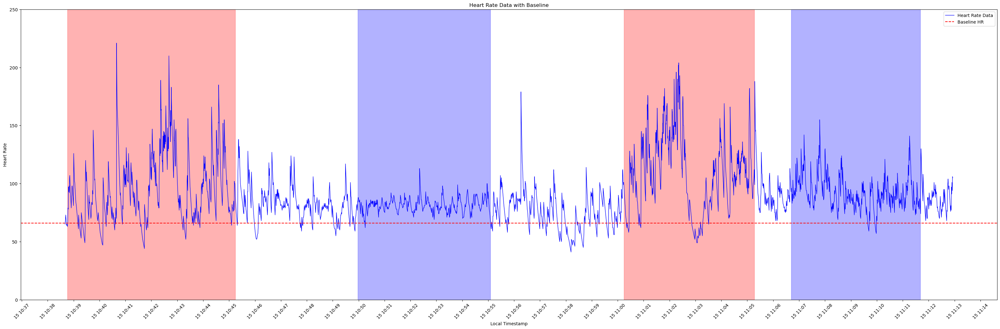

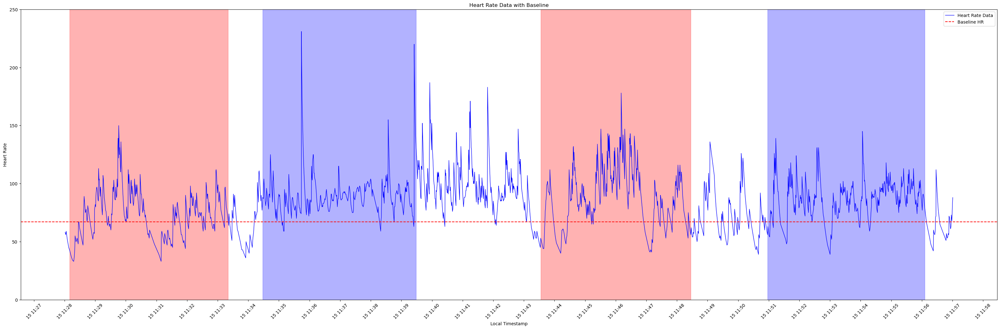

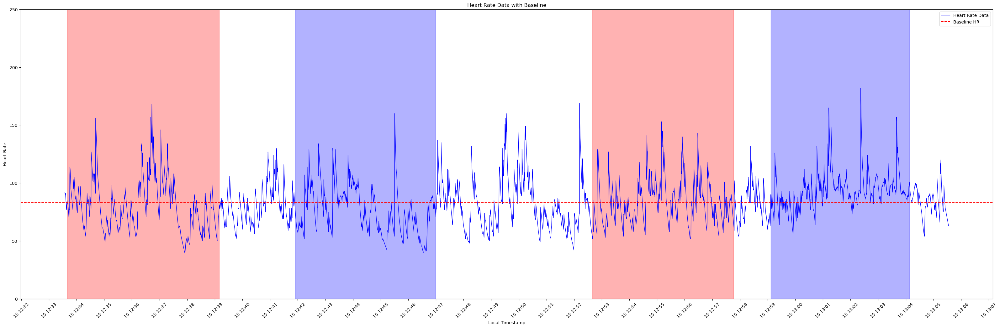

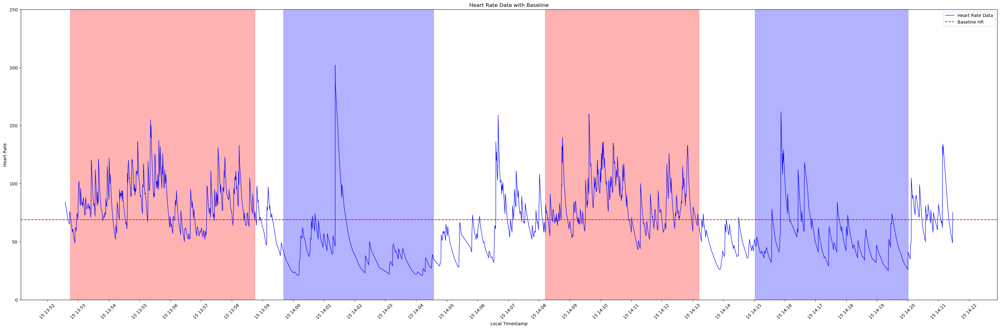

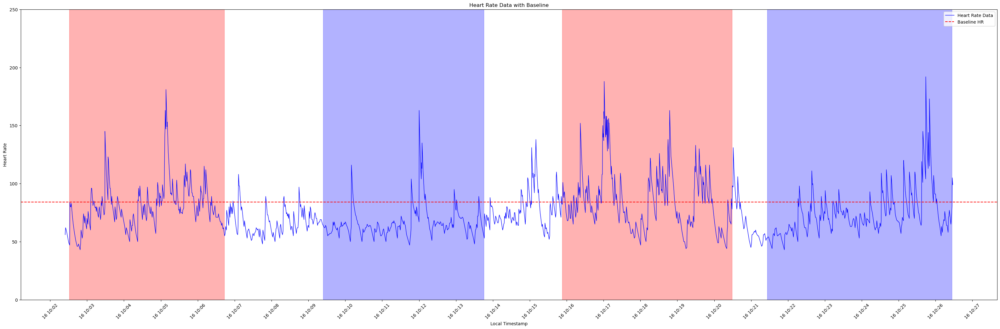

...

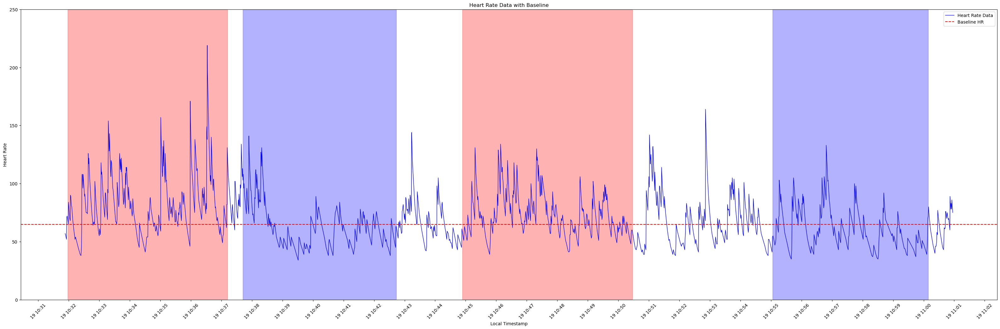

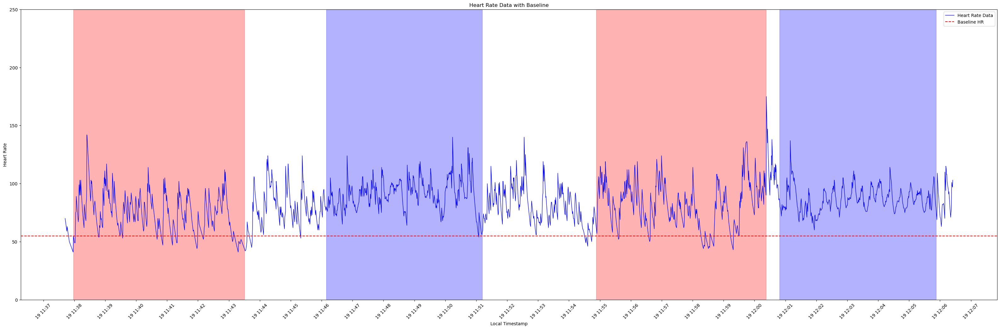

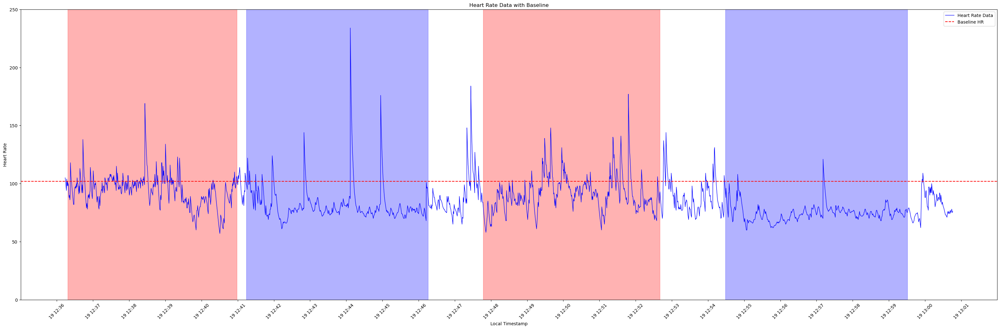

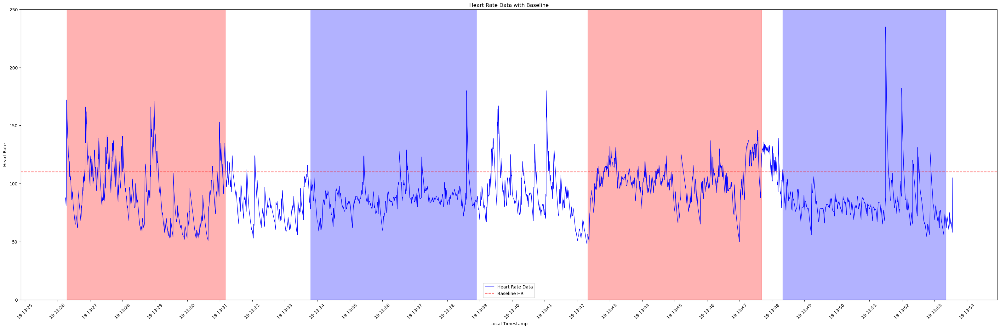

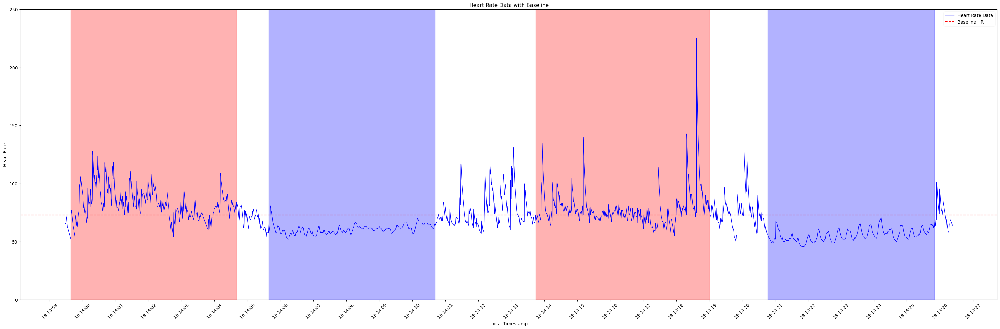

In [13]:
# Making a plot of the HR data, selected_dfs holds the dataframes with only the needed columns, and baselines holds the individual baselines for each participant
count = 0 
for selected_df, baseline_mean, (participant, regions) in zip(selected_dfs, baselines, therapy_regions.items()):
    plt.figure(figsize=(40, 12))
    plt.ylim(0, 250)
    
    selected_df = selected_dfs[count]
    
    plt.plot(selected_df['LocalTimestamp'], selected_df['HR'], color='blue', label='Heart Rate Data', linewidth=1)

    # Plotting a horizontal line, which shows the baseline
    plt.axhline(y=baseline_mean, color='red', linestyle='--', label='Baseline HR')
    
    # Adding labels and the title
    plt.xlabel('Local Timestamp')
    plt.ylabel('Heart Rate')
    plt.title('Heart Rate Data with Baseline')            
    plt.legend()

    # Set x-axis tick frequency to show more LocalTimestamps
    plt.gca().xaxis.set_major_locator(mdates.MinuteLocator(interval=1))
    
    # Rotate x-axis labels for better readability
    plt.xticks(rotation=45)
    
    # Plot shaded regions for the current participant
    for region in regions:
        start_time_str, end_time_str, color = region
        start_time_delta = pd.Timedelta('00:' + start_time_str)
        end_time_delta = pd.Timedelta('00:' + end_time_str)
        start_time = selected_df['LocalTimestamp'].iloc[0] + start_time_delta
        end_time = selected_df['LocalTimestamp'].iloc[0] + end_time_delta
        plt.axvspan(start_time, end_time, color=color, alpha=0.3)

    count += 1
    
    # Show plot
    plt.show()

In [14]:
import numpy as np

# Function to filter outliers using z-score
def filter_outliers_zscore(data, threshold=3):
    z_scores = np.abs((data - data.mean()) / data.std())
    filtered_data = data[z_scores < threshold]
    return filtered_data


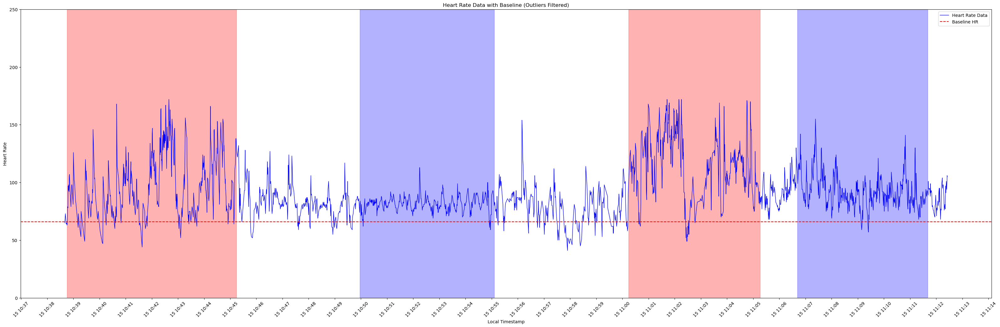

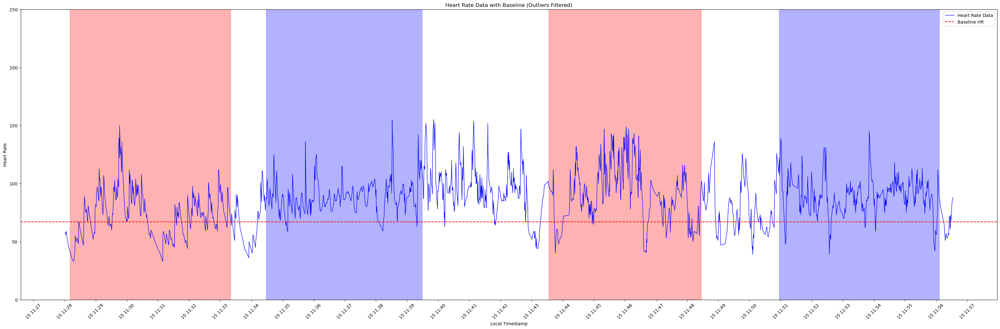

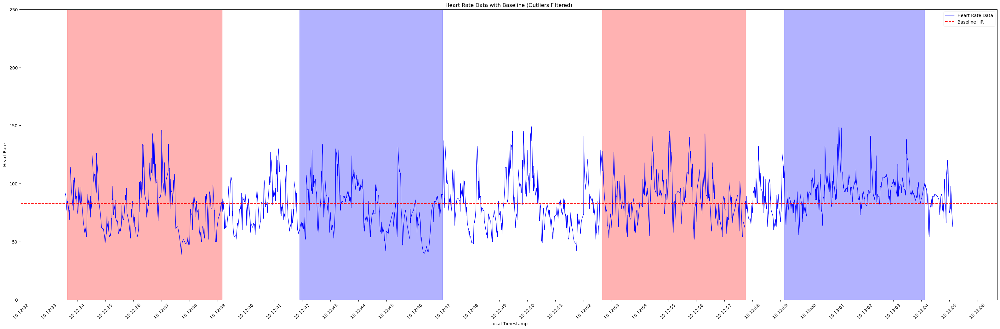

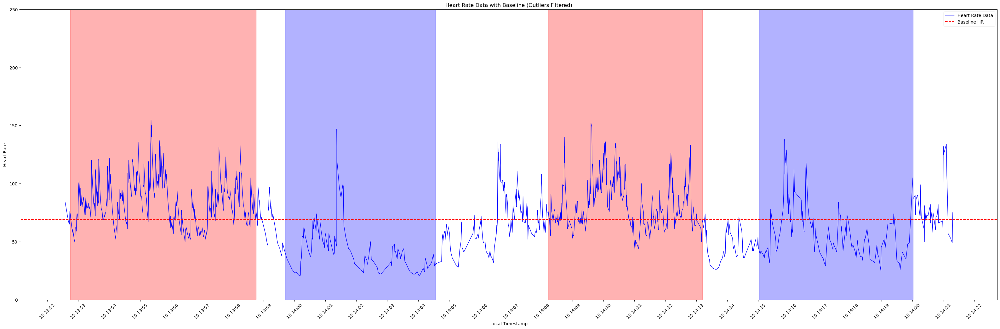

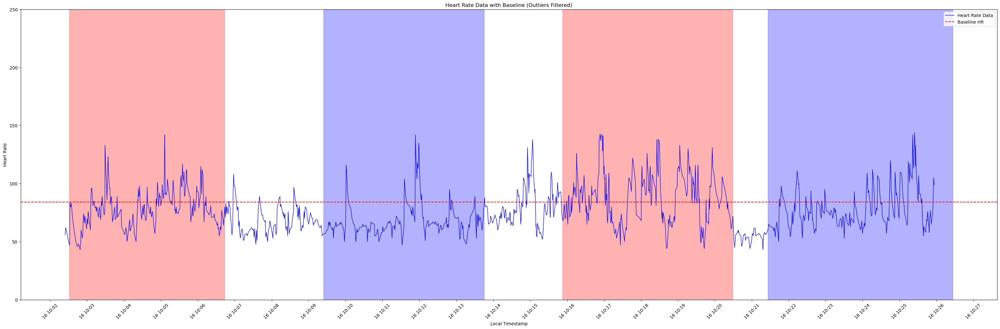

...

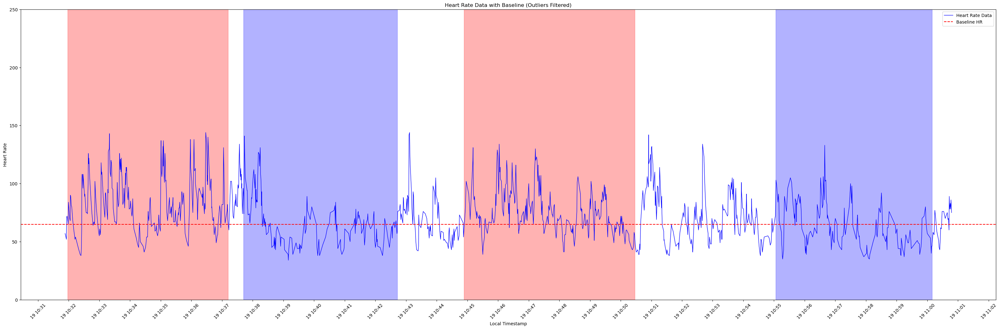

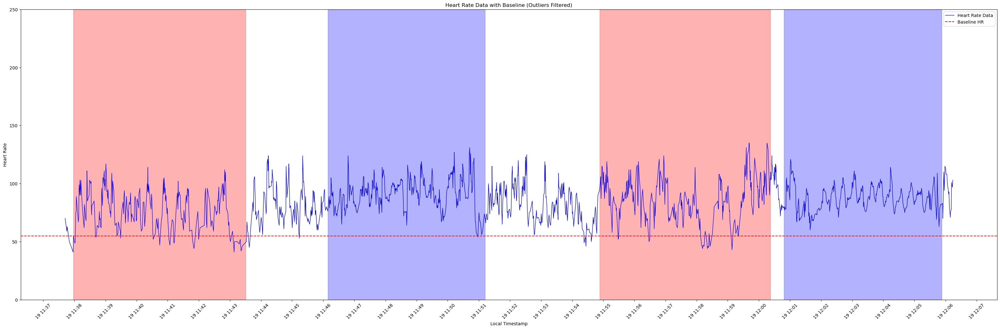

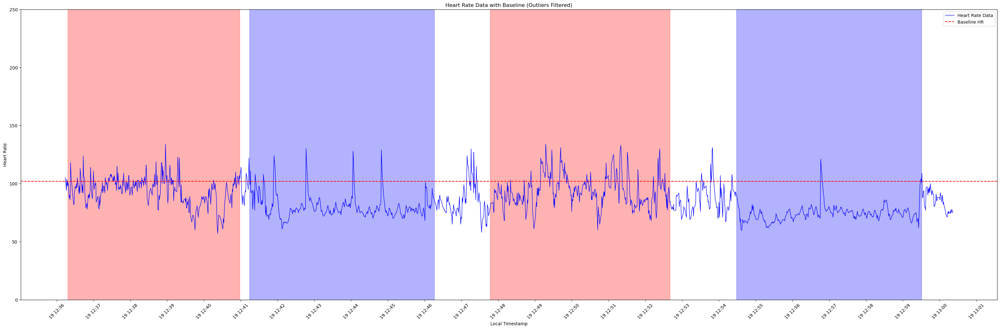

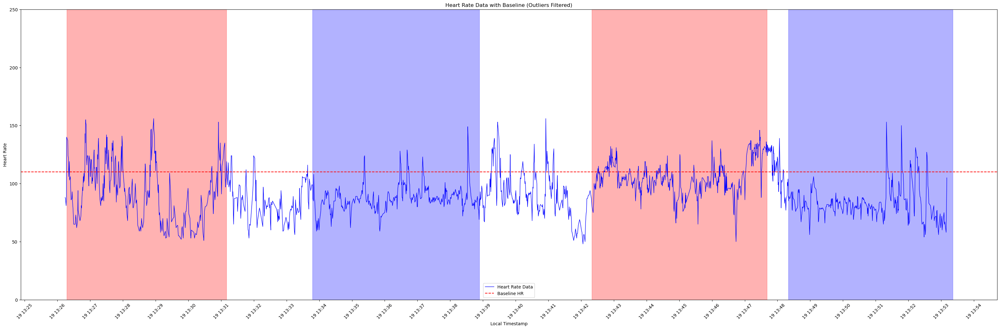

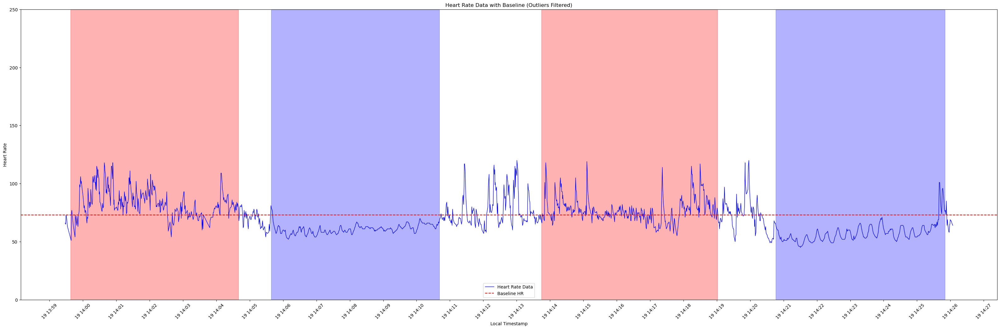

In [15]:
# Making a plot of the HR data with outlier filtering
count = 0
for selected_df, baseline_mean, (participant, regions) in zip(selected_dfs, baselines, therapy_regions.items()):
    plt.figure(figsize=(40, 12))
    plt.ylim(0, 250)
    
    selected_df = selected_dfs[count]
    # Filter outliers from heart rate data and timestamp data simultaneously
    filtered_hr_data = filter_outliers_zscore(selected_df['HR'])
    filtered_timestamps = selected_df['LocalTimestamp'].iloc[:len(filtered_hr_data)]
    
    plt.plot(filtered_timestamps, filtered_hr_data, color='blue', label='Heart Rate Data', linewidth=1)

    # Plotting a horizontal line, which shows the baseline
    plt.axhline(y=baseline_mean, color='red', linestyle='--', label='Baseline HR')

    # Adding labels and the title
    plt.xlabel('Local Timestamp')
    plt.ylabel('Heart Rate')
    plt.title('Heart Rate Data with Baseline (Outliers Filtered)')
    plt.legend()

    # Set x-axis tick frequency to show more LocalTimestamps
    plt.gca().xaxis.set_major_locator(mdates.MinuteLocator(interval=1))
    
    # Rotate x-axis labels for better readability
    plt.xticks(rotation=45)
    
    # Plot shaded regions for the current participant
    for region in regions:
        start_time_str, end_time_str, color = region
        start_time_delta = pd.Timedelta('00:' + start_time_str)
        end_time_delta = pd.Timedelta('00:' + end_time_str)
        start_time = selected_df['LocalTimestamp'].iloc[0] + start_time_delta
        end_time = selected_df['LocalTimestamp'].iloc[0] + end_time_delta
        plt.axvspan(start_time, end_time, color=color, alpha=0.3)
    
    count += 1
    
    # Show plot
    plt.show()

In [16]:
# Making a dictionary containing the participant ID and the start + end times of the therapy regions, shaded blue, so that I can easily access them
# And calculate the comparitive t-statistic for each participant.
therapy_data = {} 
count = 0

for participant, regions in therapy_regions.items():
    therapy_data[count] = []
    for i, region in enumerate(regions):
        if i % 2 == 0:  # Skip odd iterations
            continue
        # Extracting region start and end times
        start_time_str, end_time_str, color = region
        start_time_delta = pd.Timedelta('00:' + start_time_str)
        end_time_delta = pd.Timedelta('00:' + end_time_str)
        
        start_time_test = selected_dfs[count]['LocalTimestamp'].iloc[0] + start_time_delta
        end_time_test = selected_dfs[count]['LocalTimestamp'].iloc[0] + end_time_delta
        
        therapy_data[count].append((start_time_test, end_time_test))
        
    count += 1


In [17]:
start_timestamp_option1 = {}
end_timestamp_option1 = {}
start_timestamp_option2 = {}
end_timestamp_option2 = {}

# Iterateing through each participant
for participant, regions in therapy_data.items():
    # Initializing lists to store timestamps for each participant
    start_timestamp_option1[participant] = regions[0][0].strftime('%Y-%m-%d %H:%M:%S.%f%z')
    end_timestamp_option1[participant] = regions[0][1].strftime('%Y-%m-%d %H:%M:%S.%f%z')
    start_timestamp_option2[participant] = regions[1][0].strftime('%Y-%m-%d %H:%M:%S.%f%z')
    end_timestamp_option2[participant] = regions[1][1].strftime('%Y-%m-%d %H:%M:%S.%f%z')
    

In [18]:
option1_count = 0
option2_count = 0
average_heart_rate_option1 = []
average_heart_rate_option2 = []

time_to_baseline_option1 = {}
time_to_baseline_option2 = {}
heartrate_data_participants1 = []
heartrate_data_participants2 = []

for i in range(0, 21):
    # Initializing lists to store the heart rate values for each therapy option
    time_to_baseline_option1[i] = {'hr': [], 'timestamp': []}
    time_to_baseline_option2[i] = {'hr': [], 'timestamp': []}

    # Defining the start and end timestamps for therapy option 1
    start_therapy_option1 = pd.Timestamp(start_timestamp_option1[i])
    end_therapy_option1 = pd.Timestamp(end_timestamp_option1[i])

    # Filtering heart rate data and timestamp data for therapy option 1
    heart_rate_data_option1 = filter_outliers_zscore(selected_dfs[i][(selected_dfs[i]['LocalTimestamp'] >= start_therapy_option1) & 
                                      (selected_dfs[i]['LocalTimestamp'] <= end_therapy_option1)]['HR'])
    
    timestamps_option1 = filter_outliers_zscore(selected_dfs[i][(selected_dfs[i]['LocalTimestamp'] >= start_therapy_option1) & 
                                      (selected_dfs[i]['LocalTimestamp'] <= end_therapy_option1)]['LocalTimestamp'])

    
    # Defining the start and end timestamps for therapy option 2
    start_therapy_option2 = pd.Timestamp(start_timestamp_option2[i])
    end_therapy_option2 = pd.Timestamp(end_timestamp_option2[i])

    # Filtering heart rate data and timestamp data for therapy option 2
    heart_rate_data_option2 = filter_outliers_zscore(selected_dfs[i][(selected_dfs[i]['LocalTimestamp'] >= start_therapy_option2) & 
                                      (selected_dfs[i]['LocalTimestamp'] <= end_therapy_option2)]['HR'])

    timestamps_option2 = filter_outliers_zscore(selected_dfs[i][(selected_dfs[i]['LocalTimestamp'] >= start_therapy_option2) & 
                                      (selected_dfs[i]['LocalTimestamp'] <= end_therapy_option2)]['LocalTimestamp'])
    
    #Average heart rate in those regions
    avg_heart_rate_option1 = heart_rate_data_option1.mean()
    avg_heart_rate_option2 = heart_rate_data_option2.mean()

    average_heart_rate_option1.append(avg_heart_rate_option1)
    average_heart_rate_option2.append(avg_heart_rate_option2)

    heartrate_data_participants1.append(heart_rate_data_option1)
    heartrate_data_participants2.append(heart_rate_data_option2)

    # Appending heart rate values and corresponding timestamps for therapy option 1
    for hr_value, timestamp in zip(heart_rate_data_option1, timestamps_option1):
        time_to_baseline_option1[i]['hr'].append(hr_value)
        time_to_baseline_option1[i]['timestamp'].append(timestamp)
    
    # Appending heart rate values and corresponding timestamps for therapy option 2
    for hr_value, timestamp in zip(heart_rate_data_option2, timestamps_option2):
        time_to_baseline_option2[i]['hr'].append(hr_value)
        time_to_baseline_option2[i]['timestamp'].append(timestamp)


In [19]:
# Used to fill in questionnaire collumns hr start and hr end
hrr = 0
for hr in heartrate_data_participants2[20].head():
    hrr += hr
    
hrr/5 

53.4

In [20]:
timestamps_dip = {}

for therapy_num in range(0, 21):
    timestamps_dip[therapy_num] = {'option1': [], 'option2': []}
    baseline = baselines[therapy_num]
    # Initializing flags to track if option 1 and option 2 are valid
    option1_valid = True
    option2_valid = True
    
    # Checking if the first heart rate value is already below baseline for option 1
    if time_to_baseline_option1[therapy_num]['hr'][0] < baseline:
        option1_valid = False
        
    # Checking if the first heart rate value is already below baseline for option 2
    if time_to_baseline_option2[therapy_num]['hr'][0] < baseline:
        option2_valid = False
           
    if option1_valid:
        for hr, timestamp in zip(time_to_baseline_option1[therapy_num]['hr'], time_to_baseline_option1[therapy_num]['timestamp']):
            if hr < baseline:
                timestamps_dip[therapy_num]['option1'].append(timestamp)
                break
    if option2_valid:
        for hr, timestamp in zip(time_to_baseline_option2[therapy_num]['hr'], time_to_baseline_option2[therapy_num]['timestamp']):
            if hr < baseline:
                timestamps_dip[therapy_num]['option2'].append(timestamp)
                break  # Break out of the loop after the first dip below baseline
            

In [21]:
# Output timestamps of heart rate dips below baseline
# This ended up not being used in the report, due to it only working partially, decided to cut it due to shortage in time.
# I still think it is valuable info to show the alternative routes that I tried to take
for dataset, options in timestamps_dip.items():
    print(f"Dataset {dataset}:")
    for option, timestamps in options.items():
        print(f"Option {option}: {timestamps if timestamps else 'Invalid'}")
    print('\n')

Dataset 0:
Option option1: Invalid
Option option2: [Timestamp('2024-04-15 11:09:35.697588992+0200', tz='Europe/Amsterdam')]


Dataset 1:
Option option1: [Timestamp('2024-04-15 11:35:06.513160960+0200', tz='Europe/Amsterdam')]
Option option2: Invalid


Dataset 2:
Option option1: Invalid
Option option2: Invalid


Dataset 3:
Option option1: Invalid
Option option2: Invalid


Dataset 4:
Option option1: Invalid
Option option2: Invalid


Dataset 5:
Option option1: Invalid
Option option2: Invalid


Dataset 6:
Option option1: Invalid
Option option2: Invalid


Dataset 7:
Option option1: Invalid
Option option2: Invalid


Dataset 8:
Option option1: Invalid
Option option2: Invalid


Dataset 9:
Option option1: [Timestamp('2024-04-16 15:42:28.226820096+0200', tz='Europe/Amsterdam')]
Option option2: Invalid


Dataset 10:
Option option1: [Timestamp('2024-04-16 17:03:15.497991936+0200', tz='Europe/Amsterdam')]
Option option2: [Timestamp('2024-04-16 17:23:38.157170176+0200', tz='Europe/Amsterdam')]


Dat

In [22]:
non_shaded_regions = {
    'ID001': [
        ('06:34.04','11:17.48'),
        ('26:35.72','28:01.37')
    ],
    'ID002': [
        ('05:18.99','06:27.37'),
        ('20:25.70','22:56.52')
    ],
    'ID003': [
        ('05:34.83','08:19.86'),
        ('24:11.14','25:32.41')
    ],
    'ID004': [
        ('06:10.47','07:06.67'),
        ('20:37.52','22:27.47')
    ],
    'ID009': [
        ('04:18.97', '06:59.71'),
        ('18:04.71', '19:01.95')
    ],
    'ID010': [
        ('04:44.18', '05:36.99'),
        ('16:21.72', '16:57.97')
    ],
    'ID011': [
        ('05:55.57', '08:34.06'),
        ('25:09.65', '26:11.03')
    ],
    'ID012': [
        ('05:03.04', '06:13.52'),
        ('18:40.95', '22:04.80')
    ],
    'ID013': [
        ('06:59.60', '08:58.18'),
        ('22:08.24', '23:05.12')
    ],
    'ID014': [
        ('05:09.68', '10:32.97'),
        ('25:06.24', '25:08.87')
    ],
    'ID015': [
        ('05:59.70', '06:19.95'),
        ('20:53.80', '25:19.02')
    ],
    'ID007': [
        ('05:45.56', '08:47.33'),
        ('24:11.50', '25:06.50')
    ],
    'ID018': [
        ('05:08.87', '06:15.81'),
        ('18:23.93', '20:11.25')
    ],
    'ID019': [
        ('05:31.12', '07:36.00'),
        ('22:28.62', '22:56.75')
    ],
    'ID020': [
        ('05:52.81', '06:13.73'),
        ('19:33.86', '21:48.63')
    ],
    'ID025': [
        ('05:16.93', '07:36.02'),
        ('22:38.63', '23:41.95')
    ],
    'ID026': [
        ('05:18.69', '05:48.91'),
        ('18:34.78', '23:10.52')
    ],
    'ID027': [
        ('05:48.18', '08:26.81'),
        ('22:39.95', '23:06.39')
    ],
    'ID028': [
        ('04:44.64', '05:00.67'),
        ('16:26.40', '18:14.99')
    ],
    'ID029': [
        ('04:55.91', '07:33.23'),
        ('21:26.50', '22:05.81')
    ],
    'ID030': [
        ('05:11.87', '06:10.36'),
        ('19:33.07', '21:18.19')
    ]
}

In [23]:
nonshaded_data = {} 
count = 0

for participant, regions in non_shaded_regions.items():
    nonshaded_data[count] = []
    for i, region in enumerate(regions):
        # Extracting region start and end times
        start_time_str, end_time_str = region
        start_time_delta = pd.Timedelta('00:' + start_time_str)
        end_time_delta = pd.Timedelta('00:' + end_time_str)
        
        start_time_test = selected_dfs[count]['LocalTimestamp'].iloc[0] + start_time_delta
        end_time_test = selected_dfs[count]['LocalTimestamp'].iloc[0] + end_time_delta
        
        nonshaded_data[count].append((start_time_test, end_time_test))
        
    count += 1

In [24]:
# List to store formatted data
formatted_data = []

# Iterate over each pair of heart rates
for data1, data2 in zip(average_heart_rate_option1, average_heart_rate_option2):

    formatted_data.append([data1, data2])    
    # Print each pair with '-------' in between
    print("Therapy 1: {:<20} ------- Therapy 2: {:<20}".format(data1,  data2))

# VR : 8
# Traditional : 13

Therapy 1: 81.93023255813954    ------- Therapy 2: 93.26121372031662   
Therapy 1: 89.84764542936288    ------- Therapy 2: 89.31955922865014   
Therapy 1: 81.2517730496454     ------- Therapy 2: 94.4469696969697    
Therapy 1: 43.91346153846154    ------- Therapy 2: 60.25352112676056   
Therapy 1: 66.99145299145299    ------- Therapy 2: 75.31468531468532   
Therapy 1: 77.68343195266272    ------- Therapy 2: 82.42890995260663   
Therapy 1: 74.41964285714286    ------- Therapy 2: 68.18604651162791   
Therapy 1: 91.01003344481606    ------- Therapy 2: 82.1522491349481    
Therapy 1: 90.50123456790124    ------- Therapy 2: 87.08290155440415   
Therapy 1: 67.11111111111111    ------- Therapy 2: 67.61290322580645   
Therapy 1: 76.13173652694611    ------- Therapy 2: 72.35897435897436   
Therapy 1: 73.99068322981367    ------- Therapy 2: 80.40566037735849   
Therapy 1: 87.71387283236994    ------- Therapy 2: 84.35331230283911   
Therapy 1: 113.99282296650718   ------- Therapy 2: 104.100840336

In [25]:
#formatted_data

In [26]:
# Write formatted data to a CSV file
with open('formatted_heart_rates.csv', 'w', newline='') as csvfile:
    writer = csv.writer(csvfile)
    
    # Write header
    writer.writerow(['Therapy 1', 'Therapy 2'])
    
    # Write formatted data
    writer.writerows(formatted_data)

In [27]:
VR_vs_Traditional = pd.read_csv("formatted_heart_rates_finalchanged.csv", header = None)

# Split each row at the comma
VR_vs_Traditional = VR_vs_Traditional[0].str.split(',', expand=True)
# Set the first row as column headers
VR_vs_Traditional.columns = VR_vs_Traditional.iloc[0]
# Drop the first row since it's now column headers
VR_vs_Traditional = VR_vs_Traditional.drop(0)


In [28]:
# Convert data to numeric type
VR_vs_Traditional['VR Therapy'] = pd.to_numeric(VR_vs_Traditional['VR Therapy'])
VR_vs_Traditional[' Traditional Therapy'] = pd.to_numeric(VR_vs_Traditional[' Traditional Therapy'])

In [29]:
# Extract data for VR Therapy and Traditional Therapy, BEFORE TRADITIONAL THERAPY THERE IS A SPACE
vr_data = VR_vs_Traditional['VR Therapy']
traditional_data = VR_vs_Traditional[' Traditional Therapy']


In [30]:
# Perform Shapiro-Wilk test for normality for heart rate data of vr data
statistic_option1, p_value_option1 = shapiro(vr_data)

# Perform Shapiro-Wilk test for normality for heart rate data of traditional therapy
statistic_option2, p_value_option2 = shapiro(traditional_data)

# Check the p-values to determine if the data is normally distributed
if p_value_option1 > 0.05:
    print("Heart rate data for vr_data is normally distributed (p-value = {:.4f})".format(p_value_option1))
else:
    print("Heart rate data for vr_data is not normally distributed (p-value = {:.4f})".format(p_value_option1))

if p_value_option2 > 0.05:
    print("Heart rate data for traditional therapy is normally distributed (p-value = {:.4f})".format(p_value_option2))
else:
    print("Heart rate data for traditional therapy is not normally distributed (p-value = {:.4f})".format(p_value_option2))

Heart rate data for vr_data is normally distributed (p-value = 0.4014)
Heart rate data for traditional therapy is normally distributed (p-value = 0.4334)


In [31]:
# Perform paired-sample t-test
t_statistic, p_value = ttest_rel(vr_data, traditional_data)

# Print the results
print("Paired-sample t-test results:")
print("T-statistic:", t_statistic)
print("P-value:", p_value)

# Interpret the results
alpha = 0.05  # significance level
if p_value < alpha:
    print("There is a significant difference between VR Therapy and Traditional Therapy.")
else:
    print("There is no significant difference between VR Therapy and Traditional Therapy.")

Paired-sample t-test results:
T-statistic: -0.3091498132455231
P-value: 0.7604051294574252
There is no significant difference between VR Therapy and Traditional Therapy.


In [32]:
# Perform Shapiro-Wilk test for normality for heart rate data of therapy option 1
statistic_option1, p_value_option1 = shapiro(heart_rate_data_option1)

# Perform Shapiro-Wilk test for normality for heart rate data of therapy option 2
statistic_option2, p_value_option2 = shapiro(heart_rate_data_option2)

# Check the p-values to determine if the data is normally distributed
if p_value_option1 > 0.05:
    print("Heart rate data for therapy option 1 is normally distributed (p-value = {:.4f})".format(p_value_option1))
else:
    print("Heart rate data for therapy option 1 is not normally distributed (p-value = {:.4f})".format(p_value_option1))

if p_value_option2 > 0.05:
    print("Heart rate data for therapy option 2 is normally distributed (p-value = {:.4f})".format(p_value_option2))
else:
    print("Heart rate data for therapy option 2 is not normally distributed (p-value = {:.4f})".format(p_value_option2))

Heart rate data for therapy option 1 is not normally distributed (p-value = 0.0115)
Heart rate data for therapy option 2 is not normally distributed (p-value = 0.0001)


In [33]:
# Read the CSV file into a DataFrame
df = pd.read_csv("Questionnaire_data.csv", header = None)

# Columns 1, 2 (Degree of negative emotions)
for col in [0, 1]:
    statistic, p_value = shapiro(df.iloc[:, col])
    print(f"Column {col}: p-value = {p_value:.4f}")
    if p_value > 0.05:
        print("The data is normally distributed.")
    else:
        print("The data is not normally distributed.")

# Column 3 (Difference between columns 1 and 2)
statistic, p_value = shapiro(df.iloc[:, 2])
print(f"Column DNE Difference: p-value = {p_value:.4f}")
if p_value > 0.05:
    print("The data is normally distributed.")
else:
    print("The data is not normally distributed.")

# Columns 4, 5 (Degree of negative emotions)
for col in [3, 4]:
    statistic, p_value = shapiro(df.iloc[:, col])
    print(f"Column {col}: p-value = {p_value:.4f}")
    if p_value > 0.05:
        print("The data is normally distributed.")
    else:
        print("The data is not normally distributed.")
        
    
# Column 6 (Difference in heart rates)
statistic, p_value = shapiro(df.iloc[:, 5])
print(f"Column HR Difference: p-value = {p_value:.4f}")
if p_value > 0.05:
    print("The data is normally distributed.")
else:
    print("The data is not normally distributed.")

# Columns 7, 8 (Degree of negative emotions)
for col in [6, 7]:
    statistic, p_value = shapiro(df.iloc[:, col])
    print(f"Column {col}: p-value = {p_value:.4f}")
    if p_value > 0.05:
        print("The data is normally distributed.")
    else:
        print("The data is not normally distributed.")

# Column 9 (Difference between columns 7 and 8)
statistic, p_value = shapiro(df.iloc[:, 8])
print(f"Column DNE Differenc: p-value = {p_value:.4f}")
if p_value > 0.05:
    print("The data is normally distributed.")
else:
    print("The data is not normally distributed.")

     
# Columns 10, 11 (Degree of negative emotions)
for col in [9, 10]:
    statistic, p_value = shapiro(df.iloc[:, col])
    print(f"Column {col}: p-value = {p_value:.4f}")
    if p_value > 0.05:
        print("The data is normally distributed.")
    else:
        print("The data is not normally distributed.")
        
        
# Column 12 (Difference in heart rates)
statistic, p_value = shapiro(df.iloc[:, 11])
print(f"Column HR Difference: p-value = {p_value:.4f}")
if p_value > 0.05:
    print("The data is normally distributed.")
else:
    print("The data is not normally distributed.")

Column 0: p-value = 0.1090
The data is normally distributed.
Column 1: p-value = 0.0031
The data is not normally distributed.
Column DNE Difference: p-value = 0.2591
The data is normally distributed.
Column 3: p-value = 0.0548
The data is normally distributed.
Column 4: p-value = 0.5248
The data is normally distributed.
Column HR Difference: p-value = 0.7311
The data is normally distributed.
Column 6: p-value = 0.1950
The data is normally distributed.
Column 7: p-value = 0.0174
The data is not normally distributed.
Column DNE Differenc: p-value = 0.0582
The data is normally distributed.
Column 9: p-value = 0.2848
The data is normally distributed.
Column 10: p-value = 0.2704
The data is normally distributed.
Column HR Difference: p-value = 0.9796
The data is normally distributed.


In [34]:
before_data1 = df.iloc[:, 0]
after_data1 = df.iloc[:, 1]
before_data2 = df.iloc[:, 6]
after_data2 = df.iloc[:, 7]
DNE_difference1 = df.iloc[:,2]
DNE_difference2 = df.iloc[:,8]
HR_diffrerence1 = df.iloc[:,5]
HR_diffrerence2 = df.iloc[:,11]

In [35]:
#### wilcoxon Test Between DNE pre and DNE post for vr, because one column is normally distributed and one is not

# Perform Welch's t-test
t_statistic, p_value = wilcoxon(before_data1, after_data1)

# Print the results
print("Wilcoxon test results:")
print("test statistic:", t_statistic)
print("p-value:", p_value)

# Interpret the results
alpha = 0.05
if p_value < alpha:
    print("There is a significant difference between the groups.")
else:
    print("There is no significant difference between the groups.")



Wilcoxon test results:
test statistic: 0.0
p-value: 8.769942375590214e-05
There is a significant difference between the groups.


C:\ProgramData\anaconda3\Lib\site-packages\scipy\stats\_morestats.py:4088: UserWarning: Exact p-value calculation does not work if there are zeros. Switching to normal approximation.
  warnings.warn("Exact p-value calculation does not work if there are "


In [36]:
from scipy.stats import wilcoxon

#### wilcoxon Test Between DNE pre and DNE post for traditional, because one column is normally distributed and one is not

# Perform Welch's t-test
t_statistic, p_value = wilcoxon(before_data2, after_data2)

# Print the results
print("Wilcoxon test results:")
print("test statistic:", t_statistic)
print("p-value:", p_value)

# Interpret the results
alpha = 0.05
if p_value < alpha:
    print("There is a significant difference between the groups.")
else:
    print("There is no significant difference between the groups.")

Wilcoxon test results:
test statistic: 0.0
p-value: 8.584625213760735e-05
There is a significant difference between the groups.


In [37]:
#### WELCH'S T-Test Between DNE Difference 1 and DNE Difference 2

# Perform Welch's t-test
t_statistic, p_value = stats.ttest_ind(DNE_difference1, DNE_difference2, equal_var=False)

# Print the results
print("Welch's t-test results:")
print("t-statistic:", t_statistic)
print("p-value:", p_value)

# Interpret the results
alpha = 0.05
if p_value < alpha:
    print("There is a significant difference between the groups.")
else:
    print("There is no significant difference between the groups.")

Welch's t-test results:
t-statistic: 1.2780343155332765
p-value: 0.20867767753138558
There is no significant difference between the groups.


In [38]:
# Multiply the heart rate differences by -1 
# So that a positive number is also connected with a rise in heart rate
HR_diffrerence1_reversed = HR_diffrerence1 * -1

# Perform Pearson's correlation coefficient analysis
correlation_coefficient, p_value = pearsonr(HR_diffrerence1_reversed, DNE_difference1)

# Print the results
print("Pearson's correlation coefficient:", correlation_coefficient)
print("p-value:", p_value)

# Interpret the results
alpha = 0.05
if p_value < alpha:
    print("There is a significant correlation between the variables.")
else:
    print("There is no significant correlation between the variables.")

Pearson's correlation coefficient: -0.134590874478734
p-value: 0.5607937730448961
There is no significant correlation between the variables.


In [39]:
# Multiply the heart rate differences by -1 
# So that a positive number is also connected with a rise in heart rate
HR_diffrerence2_reversed = HR_diffrerence2 * -1

# Perform Pearson's correlation coefficient analysis
correlation_coefficient, p_value = pearsonr(HR_diffrerence2_reversed, DNE_difference2)

# Print the results
print("Pearson's correlation coefficient:", correlation_coefficient)
print("p-value:", p_value)

# Interpret the results
alpha = 0.05
if p_value < alpha:
    print("There is a significant correlation between the variables.")
else:
    print("There is no significant correlation between the variables.")

Pearson's correlation coefficient: -0.02965457840654019
p-value: 0.8984650539327077
There is no significant correlation between the variables.


In [40]:
# Multiply the heart rate differences by -1 
# So that a positive number is also connected with a rise in heart rate
HR_diffrerence1_reversed = HR_diffrerence1 * -1
HR_diffrerence2_reversed = HR_diffrerence2 * -1

# Perform Welch's t-test
t_statistic, p_value = stats.ttest_ind(HR_diffrerence1_reversed, HR_diffrerence2_reversed, equal_var=False)

# Print the results
print("Welch's t-test results:")
print("t-statistic:", t_statistic)
print("p-value:", p_value)

# Interpret the results
alpha = 0.05
if p_value < alpha:
    print("There is a significant difference between the groups.")
else:
    print("There is no significant difference between the groups.")

Welch's t-test results:
t-statistic: 1.1121965844537602
p-value: 0.2730696638696699
There is no significant difference between the groups.
